## Лабораторная работа №4

### Базовые морфологические операции

Термин морфология дословно переводится как «наука о форме».
Морфологический анализ используется во многих областях знаний,
в т.ч. и в обработке изображений. Морфологический анализ является относительно универсальным подходом,
поэтому стоит обособленно от всех рассмотренных ранее методов. С использованием математической морфологии при обработке
изображений можно осуществлять фильтрацию шумов, сегментацию объектов, выделение
контуров, реализовать поиск заданного объекта на изображении,
вычислить «скелет» образа и т.д.


In [ ]:
import imutils
import cv2
import os
import skimage.color
import skimage.segmentation
import skimage.measure
import skimage.feature
import skimage.morphology
import scipy.ndimage
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# Исходное изображение
image = cv2.imread("/content/drive/MyDrive/lr4/oranges.jpg")

Попробуем выделить по цвету апельсины на изображении.

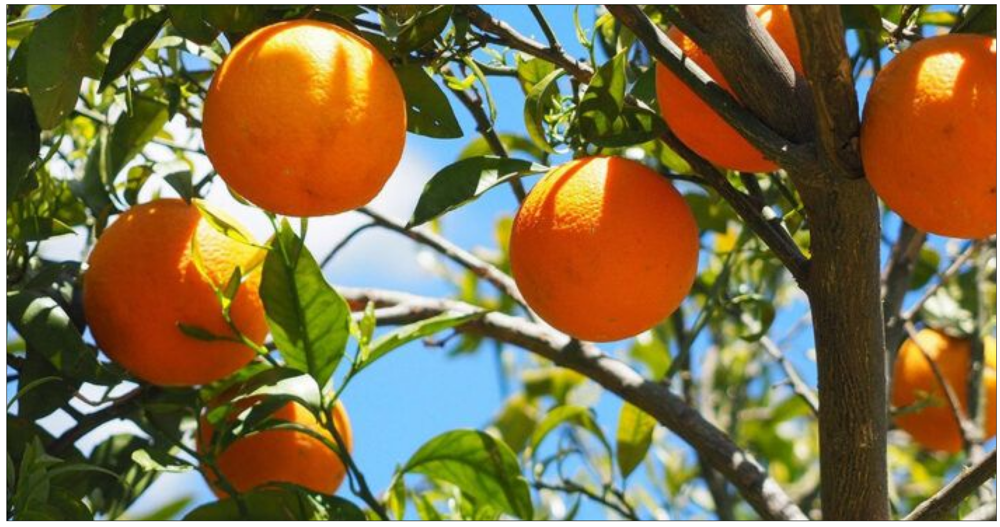

In [ ]:
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

In [ ]:
# Перевод в пространство HSV
image = cv2.cvtColor(np.float32(image / 255.0), cv2.COLOR_BGR2HSV)

# Фильтрация по Гауссу
image = cv2.GaussianBlur(image, (5, 5), 1)

# Создание маски
image_mask = np.logical_and(
    np.logical_or(image[:,:,0] < 50.0, image[:,:,0] > 345.0), # Hue < 50 or Hue > 345
    np.logical_and(
        image[:,:,1] > 0.4, # Saturation > 0.3
        image[:,:,2] > 0.4, # Lightness > 0.25
    )
)

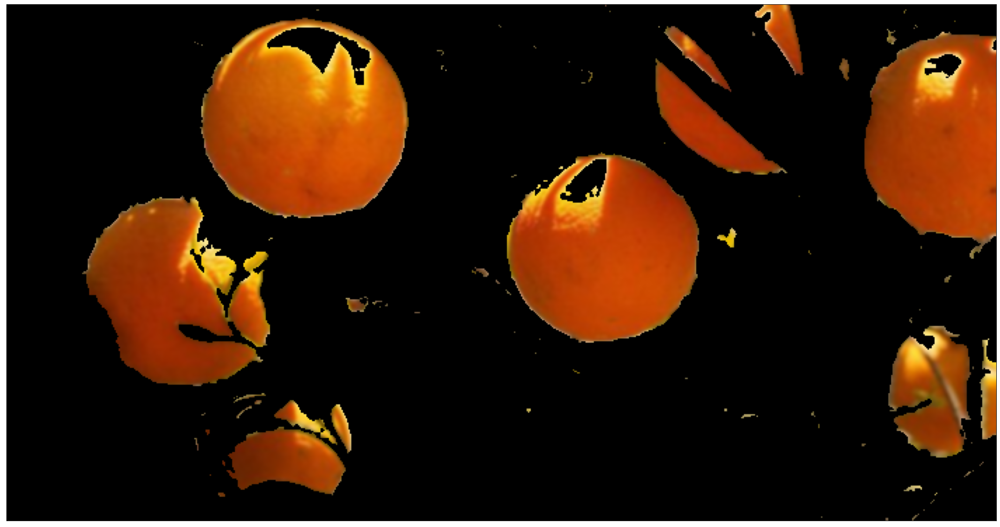

In [ ]:
# Результат до морфологической фильтрации
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(cv2.bitwise_and(image, image, mask=np.uint8(image_mask * 255)), cv2.COLOR_HSV2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

In [ ]:
# Открытие (отмыкание, размыкание, раскрытие): (𝐴 ⊖ 𝐵) ⊕ 𝐵
selem = skimage.morphology.disk(7)
image_mask = skimage.morphology.erosion(image_mask, selem)
image_mask = skimage.morphology.dilation(image_mask, selem)

# Закрытие (замыкание): (𝐴 ⊕ 𝐵) ⊖ 𝐵
selem = skimage.morphology.disk(11)
image_mask = skimage.morphology.dilation(image_mask, selem)
image_mask = skimage.morphology.erosion(image_mask, selem)

# Находит набор это набор пикселей, входящих в наименьший выпуклый многоугольник,
# который окружает все белые пиксели входного изображения.
# Выполняется индивидуально для каждого несвязного множества кипселей
image_mask = skimage.morphology.convex_hull_object(image_mask)

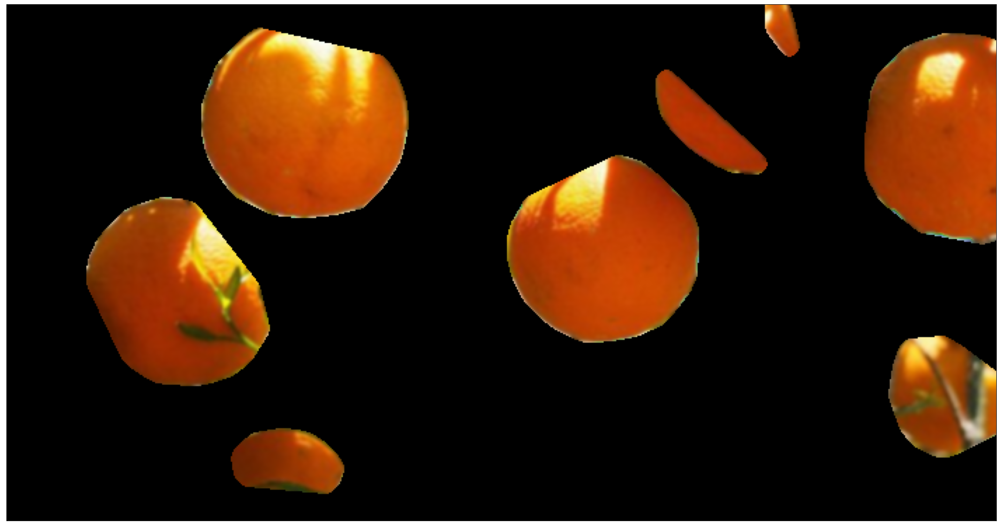

In [ ]:
# Результат после морфологической фильтрации
figure(figsize=(32, 16), dpi=80)
image_to_show = cv2.bitwise_and(image, image, mask=np.uint8(image_mask * 255))
plt.imshow(cv2.cvtColor(image_to_show, cv2.COLOR_HSV2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

### Разделение «склеенных» объектов

Одним из примеров использования морфологических операций
над изображением может быть задача разделения склеившихся на
изображении объектов. Задача может быть решена с достаточной
степенью точности при помощи последовательного выполнения
нескольких раз фильтра сжатия, а затем максимально возможного
расширения полученного результата. Пересечение исходного изображения
с обработанным позволит разделить склеенные объекты.

In [ ]:
# Исходное изображение
image = cv2.imread("/content/drive/MyDrive/lr4/coins.jpg")

На следующем изображении будет задача разделить изображение на непересекающиеся области.

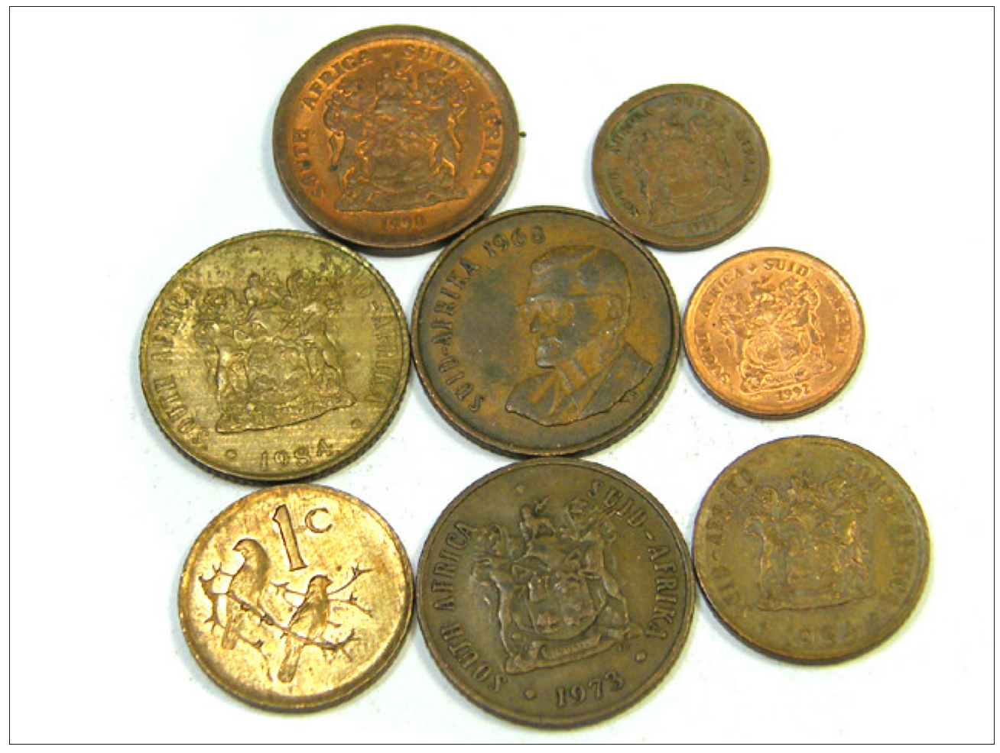

In [ ]:
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

In [ ]:
# Перевод в пространство HSV
image = cv2.cvtColor(np.float32(image / 255.0), cv2.COLOR_BGR2HSV)

# Создание маски
image_mask = image[:,:,1] > 0.15 # Saturation > 0.1

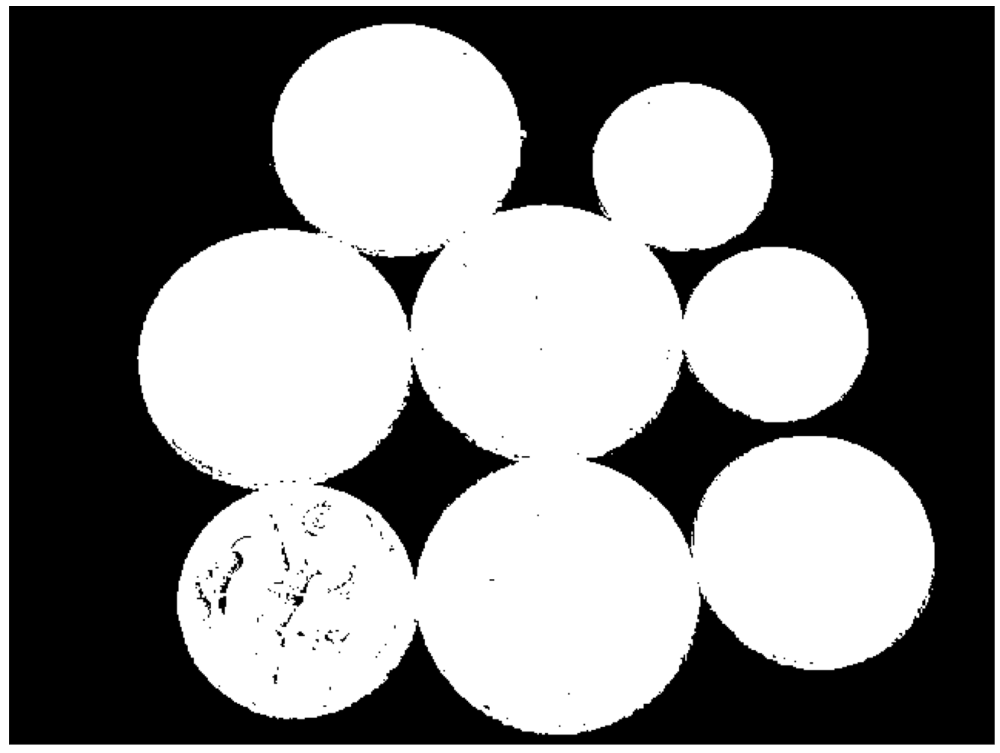

In [ ]:
# Вид маски до морфологической фильтрации
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(np.uint8(image_mask * 255), cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

In [ ]:
# Слабое закрытие (замыкание): (𝐴 ⊕ 𝐵) ⊖ 𝐵
selem = skimage.morphology.disk(3)
image_mask = skimage.morphology.dilation(image_mask, selem)
image_mask = skimage.morphology.erosion(image_mask, selem)

expanded = image_mask.copy()

# Многократное сжатие
selem = skimage.morphology.disk(5)
for i in range(7):
    expanded = skimage.morphology.erosion(expanded, selem)

# Расширение до пересечения через дополнительный массив, чтобы края изображения не портили результат.
size=np.array(expanded.shape)
expanded_huge = np.zeros(shape=size * 3, dtype=np.bool)
expanded_huge[size[0]:2*size[0], size[1]:2*size[1]] = expanded
expanded = expanded_huge
expanded_huge = np.logical_not(expanded_huge)
expanded_huge = skimage.morphology.thin(expanded_huge)
expanded_huge = np.logical_not(expanded_huge)
expanded = expanded_huge[size[0]:2*size[0], size[1]:2*size[1]]
image_mask = np.logical_and(image_mask, expanded)

# Слабая эрозия: 𝐴 ⊖ 𝐵
selem = skimage.morphology.disk(3)
image_mask = skimage.morphology.erosion(image_mask, selem)

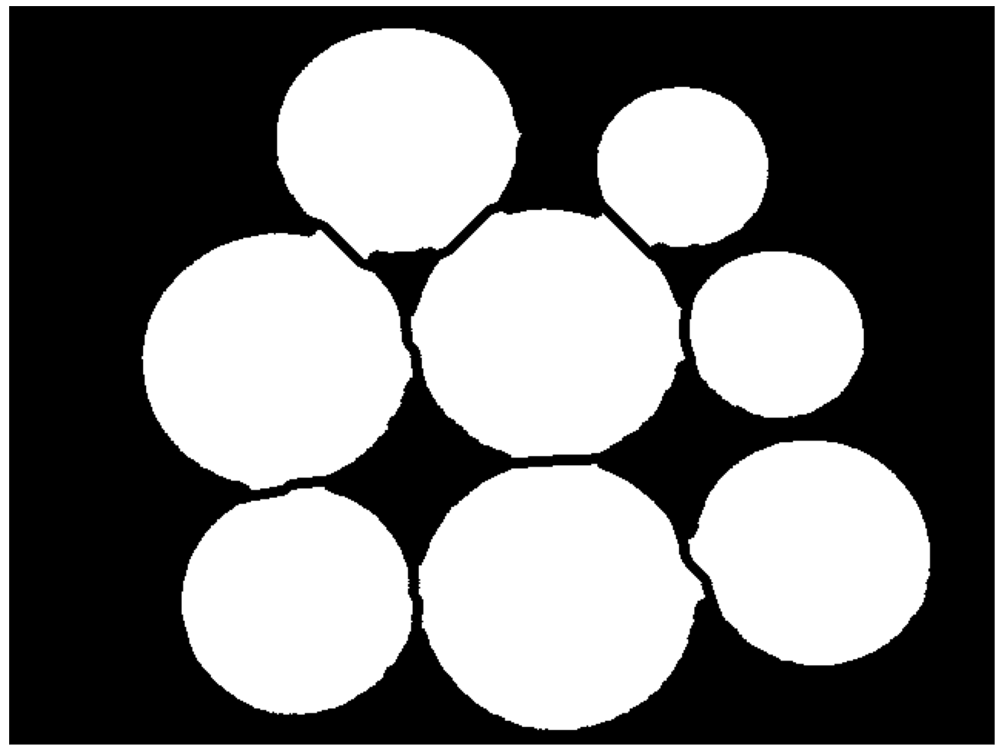

In [ ]:
# Вид маски после морфологической фильтрации
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(np.uint8(image_mask * 255), cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


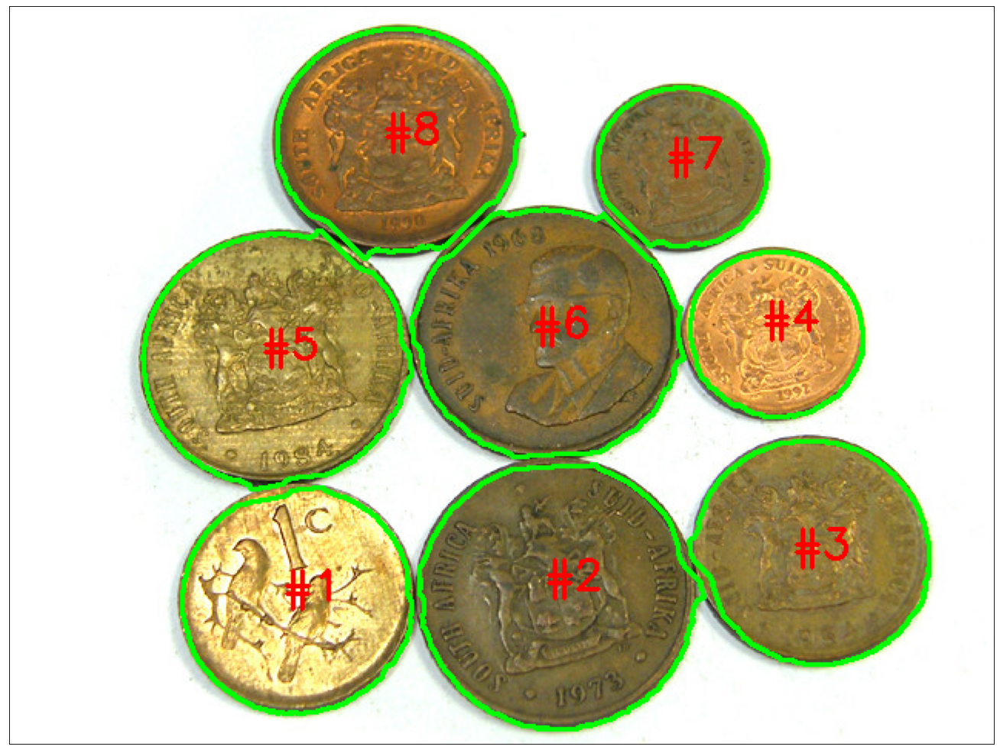

In [ ]:
# Результат после морфологической фильтрации и выделения контуров
figure(figsize=(32, 16), dpi=80)
thresh = cv2.threshold(np.uint8(image_mask * 255), 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
print(thresh[1])
cnts = cv2.findContours(thresh[1], cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)
image_to_show = cv2.cvtColor(image, cv2.COLOR_HSV2BGR)
for (i, c) in enumerate(cnts):
    # draw the contour
    ((x, y), _) = cv2.minEnclosingCircle(c)
    cv2.putText(image_to_show, "#{}".format(i + 1), (int(x) - 10, int(y)),
        cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 0, 255), 2)
    cv2.drawContours(image_to_show, [c], -1, (0, 255, 0), 2)
plt.imshow(cv2.cvtColor(image_to_show, cv2.COLOR_BGR2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

Результат разделения объектов получился на удивление хорошим, хотя и на месте стыка присутствуют неровности.

Главным недостатком такого метода является скорость работы, так как функция skimage.morphology.thin
мало того что для корректного расширения должна вызывать себя несколько сотен раз, так и ещё и в skimage нет нужной
функции, и поэтому пришлось расширять пространство в 9 раз, чтобы края не вносили свой вклад.
Этого можно было избежать, если вручную поменять код функции skimage.morphology.thin
или написать нужную функцию с нуля.

### Сегментация изображения по водоразделам

Рассмотрим еще один из примеров применения математической
морфологии к задаче сегментации изображения. В подходе сегментации по водоразделам изображение рассматривается
как карта высот, на котором интенсивности пикселей описывают высоты относительно некоторого уровня.
На такую «высотную местность» «льет
дождь», образуя множество водосборных бассейнов. Постепенно вода из переполненных бассейнов переливается,
и бассейны объединяются в более крупные. Места объединения бассейнов
отмечаются как линии водораздела. Если «дождь» остановить рано, тогда изображение будет сегментировано
на мелкие области, а
если поздно — на крупные. В таком подходе все пиксели подразделяются на три типа:

1. локальные минимумы;

2. находящиеся на склоне (с которых вода скатывается в один и
тот же локальный минимум);

3. локальные максимумы (с которых вода скатывается более чем
в один минимум).


В результате работы алгоритма будет получена маска, где пиксели одинаковых сегментов будут помечены одинаковыми метками
и будут образовывать связную область.

In [ ]:
# Исходное изображение
image = cv2.imread("/content/drive/MyDrive/lr4/coins_2.jpg")

Попробую сегментировать методом водораздела монеты.

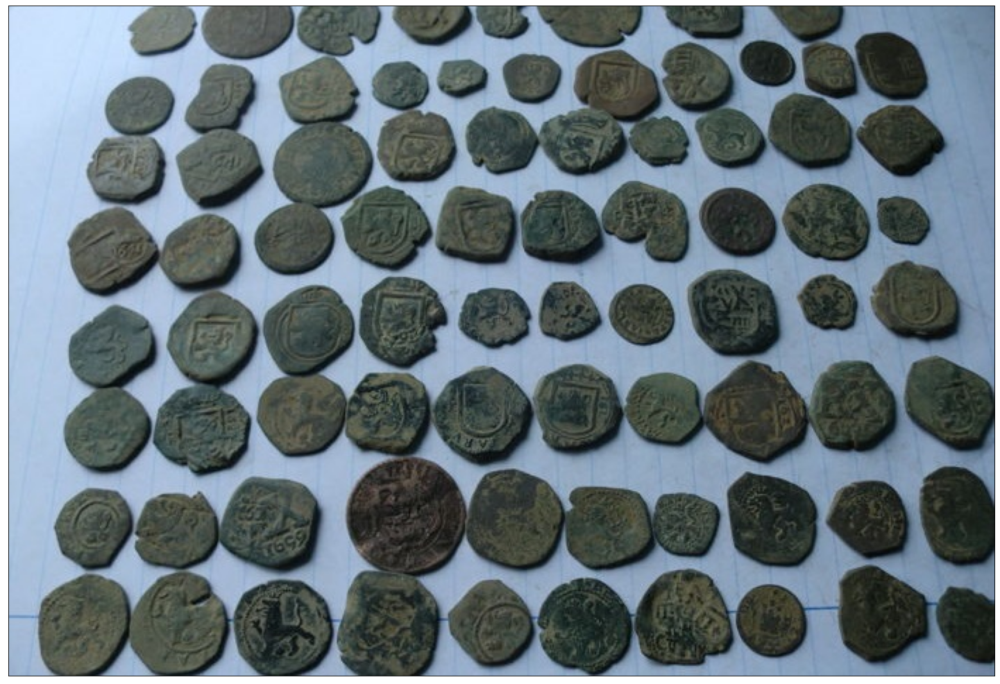

In [ ]:
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

In [ ]:
# Перевод в пространство HSV
image = cv2.cvtColor(np.float32(image / 255.0), cv2.COLOR_BGR2HSV)

# Создание маски для цвета яблок
image_mask = image[:,:,2] < 0.6

# Открытие (отмыкание, размыкание, раскрытие): (𝐴 ⊖ 𝐵) ⊕ 𝐵
selem = skimage.morphology.disk(11)
image_mask = skimage.morphology.erosion(image_mask, selem)
image_mask = skimage.morphology.dilation(image_mask, selem)

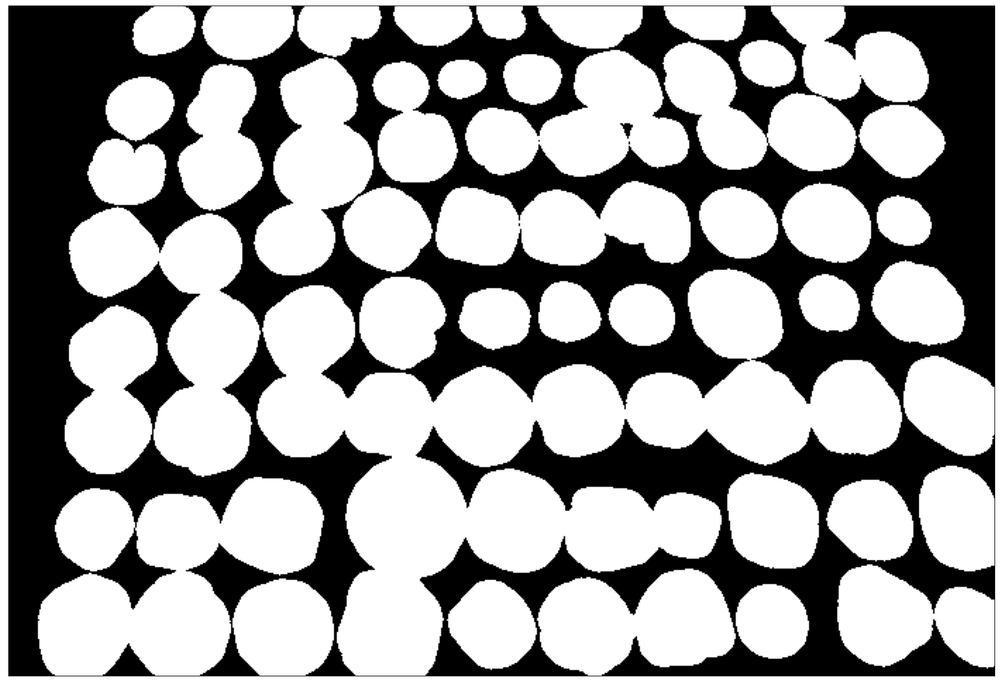

In [ ]:
# Вид маски после морфологической фильтрации, до сегментации водоразделом
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(np.uint8(image_mask * 255), cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

In [ ]:
# Составление рельефа
D = scipy.ndimage.distance_transform_edt(image_mask * 1)

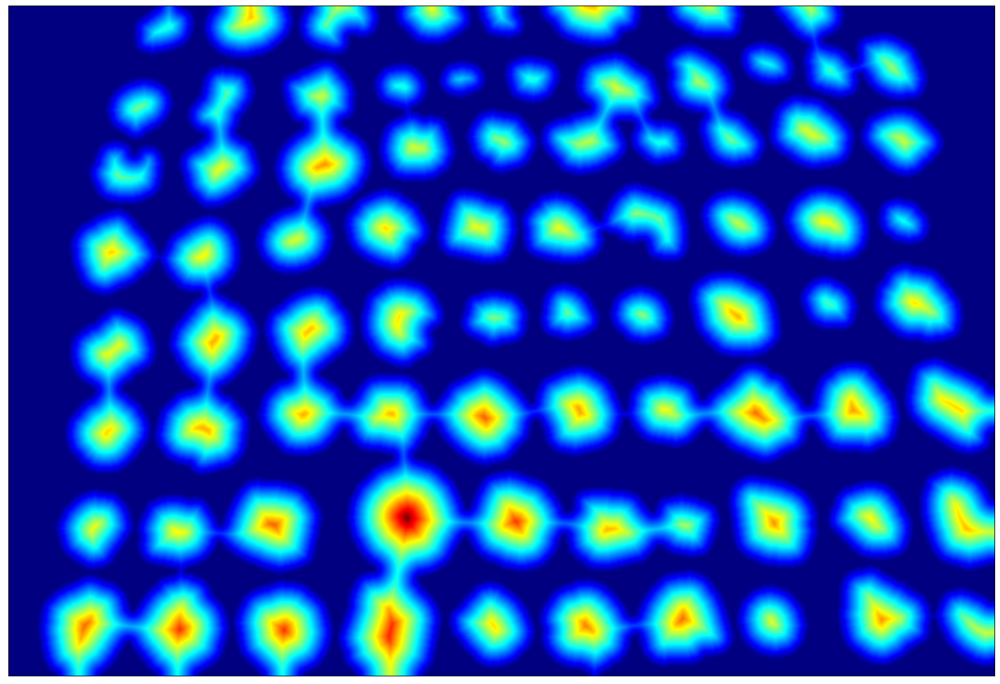

In [ ]:
# *Глубина* впадины, куда будет стекать вода
figure(figsize=(32, 16), dpi=80)
D_heat = np.float32(D / np.max(D))
heat = cv2.applyColorMap(np.uint8(D_heat * 255), cv2.COLORMAP_JET)
plt.imshow(cv2.cvtColor(heat, cv2.COLOR_BGR2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

In [ ]:
# Выбор локальных минимумов рельефа
localMax = skimage.feature.peak_local_max(D, indices=False, min_distance=15, labels=image_mask)
markers = scipy.ndimage.label(localMax, structure=np.ones((3, 3)))[0]

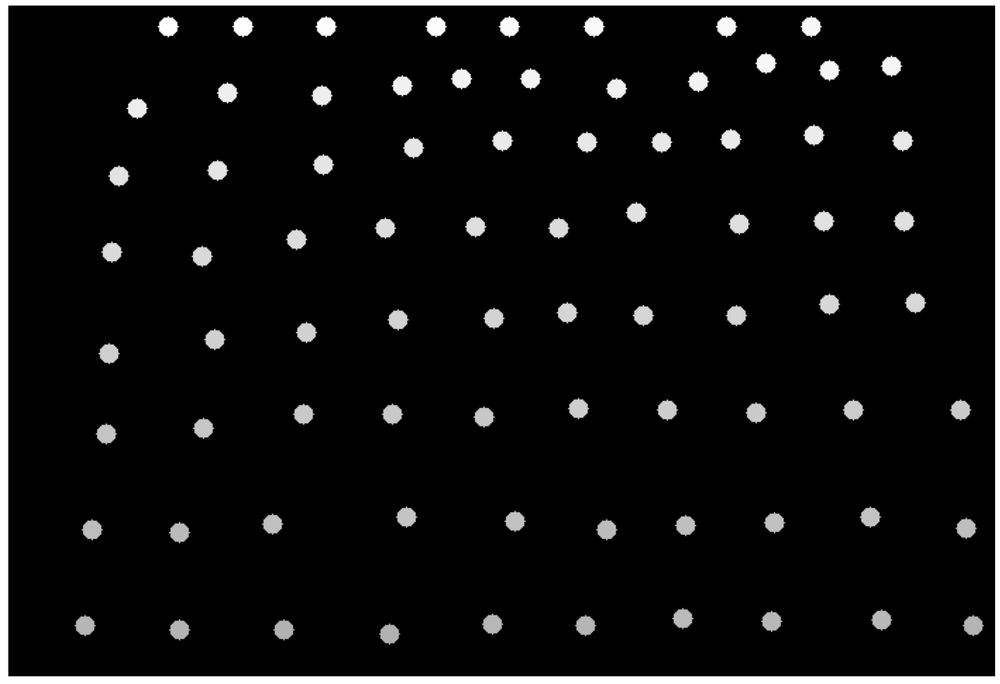

In [ ]:
# Локальные минимумы рельефа в виде точек
figure(figsize=(32, 16), dpi=80)
image_to_show = markers
selem = skimage.morphology.disk(7)
image_to_show = skimage.morphology.dilation(image_to_show, selem)
image_to_show = cv2.cvtColor(np.uint8(image_to_show * 255), cv2.COLOR_GRAY2RGB)
plt.imshow(image_to_show)
plt.xticks([]),plt.yticks([])
plt.show()

In [ ]:
# Выполнение сегментации водоразделом
labels = skimage.segmentation.watershed(-D, markers, mask=image_mask)


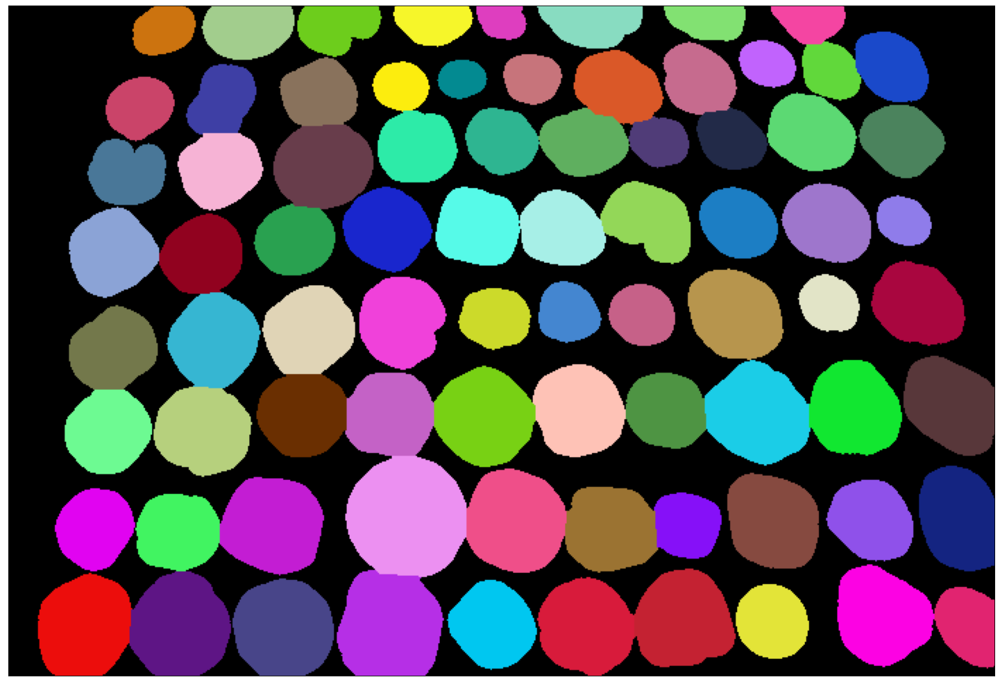

In [ ]:
# Результат сегментации водоразделом
figure(figsize=(32, 16), dpi=80)
labels_colored = np.zeros_like(labels, dtype=np.uint8)
labels_colored = cv2.cvtColor(labels_colored, cv2.COLOR_GRAY2RGB)
for label in np.unique(labels):
    if label == 0:
        continue
    labels_colored[labels == label] = np.uint8(np.round((np.random.rand(3) * 255)))
plt.imshow(labels_colored)
plt.xticks([]),plt.yticks([])
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


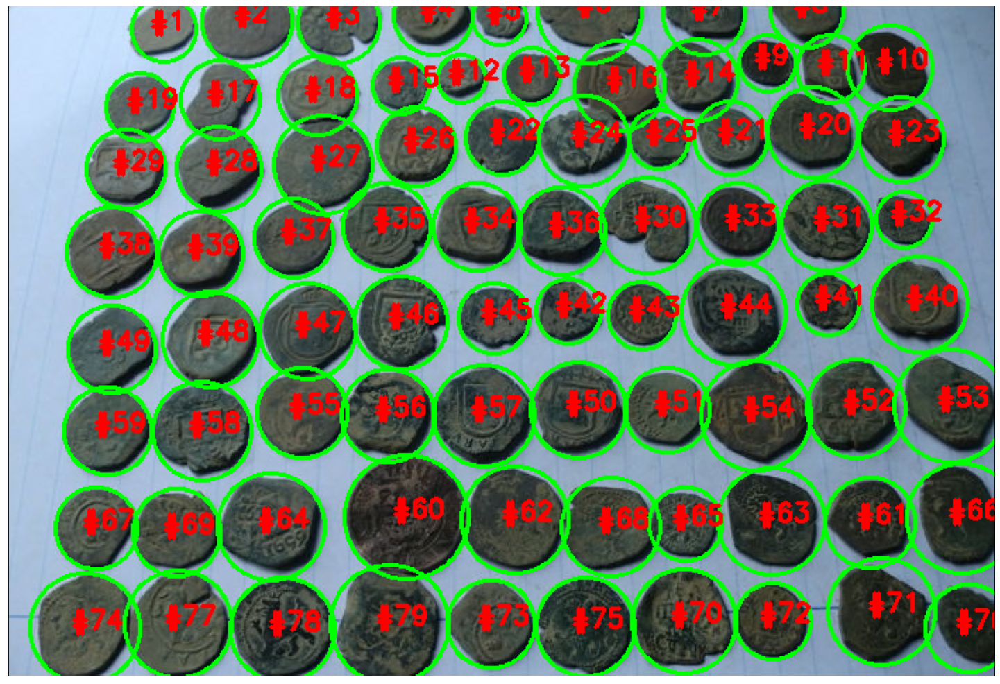

label_count = 79


In [ ]:
# Результат после сегментации водоразделом и выделения контуров
figure(figsize=(32, 16), dpi=80)
image_to_show = cv2.cvtColor(image, cv2.COLOR_HSV2BGR)
label_count = 0
for label in np.unique(labels):
    if label == 0:
        continue
    mask = np.zeros(image_mask.shape, dtype="uint8")
    mask[labels == label] = 255
    cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    c = max(cnts, key=cv2.contourArea)
    ((x, y), r) = cv2.minEnclosingCircle(c)
    cv2.circle(image_to_show, (int(x), int(y)), int(r), (0, 255, 0), 2)
    cv2.putText(image_to_show, "#{}".format(label), (int(x) - 10, int(y)),
        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
    label_count = label
plt.imshow(cv2.cvtColor(image_to_show, cv2.COLOR_BGR2RGB))
plt.xticks([]),plt.yticks([])
plt.show()
print(f"label_count = {label_count}")